#  Exercise 3 - Clustering

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import normalized_mutual_info_score
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

### 1. “eps” (ε) and “minPts” (mP) in DBSCAN algorithm for clustering

Starting from plotting the distance of the firsts $n$ point from a rank of $600$ points, we get an idea on what are the distances between points in the dataset.
We then compute the mean minimum distance between points: $162.35$.
From this we start implementing the DBSCAN algorithm while refining the grid with more values of ε, as function of the mean minimum distance and mPts and plot a heat-map
showing the normalized mutual information (NMI) between true and predicted clusters.

We note there is a hot spot where NMI values are much higher in the space: epsilon $\in [200,260]$ and min_Pts $\in [0,10]$, with NMI values aound $0.6-0.7$. We notice what we call the 'obvious channel', that is the diagonal channel with NMI values comprised between $0.2-0.6$.  We call it 'obvious' since we know that by augmenting the epsilon, it is possible to cluster with higher minPts, but the quality of this clustering is very low.


Regarding the last request - the comparison with the plots of ranked distances to the i-th neighbor - we believe it could be a useful tool for choosing epsilon given mP. This can be used by selecting the average distance of the mP-th point, in such a way as to cut off the tail that begins an exponential trend, which could indicate a noisy region where the pattern fades.

In [2]:
path = 'DATA/'
x = np.loadtxt(path + 'x_12d.dat')
label = np.loadtxt(path + 'y_12d.dat')

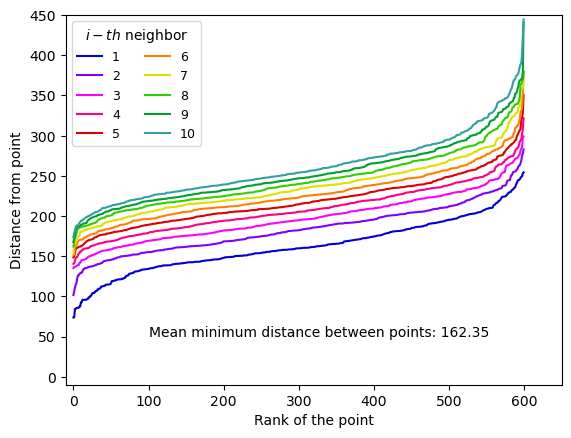

In [3]:
nn = 10
nbrs = NearestNeighbors(n_neighbors=nn+1).fit(x) 
d, ind = nbrs.kneighbors(x)
dd=d.T
# note: dd[0] has a trivial set of zeros
listc= ["#0000DD","#8000FF","#FF00FF","#FF0080","#DD0000",
        "#FF8000","#E0E000","#30D000","#00A030","#33A0A0"]
for i in range(1,nn+1):
    plt.plot(np.sort(dd[i]),c=listc[i-1],label=str(i))
    plt.xlabel("Rank of the point")
    plt.ylabel("Distance from point")

plt.legend(ncol=2, title='$i-th$ neighbor', fontsize=9)
plt.yticks(np.arange(0,500,50))
plt.ylim((-10,450))
plt.xticks(np.arange(0,700,100))
plt.xlim((-10,650))
mean_min_dist = np.mean(dd[1])
plt.text(100,50,f'Mean minimum distance between points: {mean_min_dist:.2f}')
plt.show()

In [4]:
eps_values = np.arange(0.01,4,0.05)* mean_min_dist
minPts_values = np.arange(2,51)
nmi_values = []

for eps in eps_values:
    for minPts in minPts_values:
        db = DBSCAN(eps=eps, min_samples=minPts, n_jobs=-1)
        pred = db.fit_predict(x)
        nmi = normalized_mutual_info_score(label, pred)
        nmi_values.append(nmi)
nmi_matrix = np.reshape(nmi_values, (len(eps_values), len(minPts_values)))

In [5]:
dbest = np.unravel_index(nmi_matrix.argmax(), nmi_matrix.shape)
print(f'maximum score: {nmi_matrix.max()}\nbest_eps: {(best_eps := eps_values[dbest[0]])}\nbest_minpts: {(best_pts := minPts_values[dbest[1]])}')

maximum score: 0.7714454028652104
best_eps: 261.3774216756223
best_minpts: 2


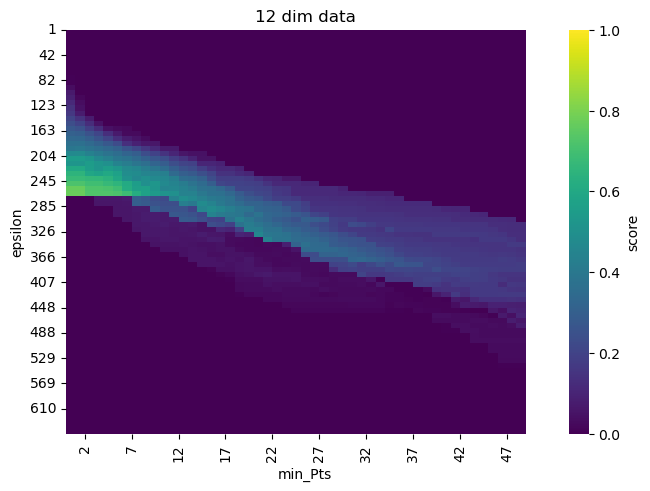

In [6]:
fig, ax = plt.subplots(layout='constrained')
heatmap =sns.heatmap(nmi_matrix, xticklabels=minPts_values, yticklabels=eps_values, ax=ax, vmin=0,vmax=1,cmap='viridis', cbar_kws={'label':'score'})
plt.title('12 dim data')
plt.ylabel('epsilon')
plt.xlabel('min_Pts')


plt.xticks(np.arange(2,51,5),np.arange(2,51,5) )
plt.xlim(0,51)
plt.yticks(np.arange(0,len(eps_values),5), (np.arange(0.01,4,0.25)*mean_min_dist).astype(int))
plt.show()

### 2. Understanding the 12-dimensional data

We execute the PCA over the data using sklearn. We show the variance ratios and see that, as we expect from how the data is generated, the number of features which carry information is $3$.

We finally plot each pair of features before and after the PCA analysis to visually show the structures of the dataset. The colors are associated with the true labels.
We see that after PCA only features $0$, $1$, $2$ show structures, while the other features are just noise.

In [7]:
def standardize(data):
    data_mean = np.mean(data, axis=0)
    data_std = np.std(data, axis=0)
    standardized_data = (data - data_mean ) / data_std
    return standardized_data

standardized_data = standardize(x)

## Before PCA

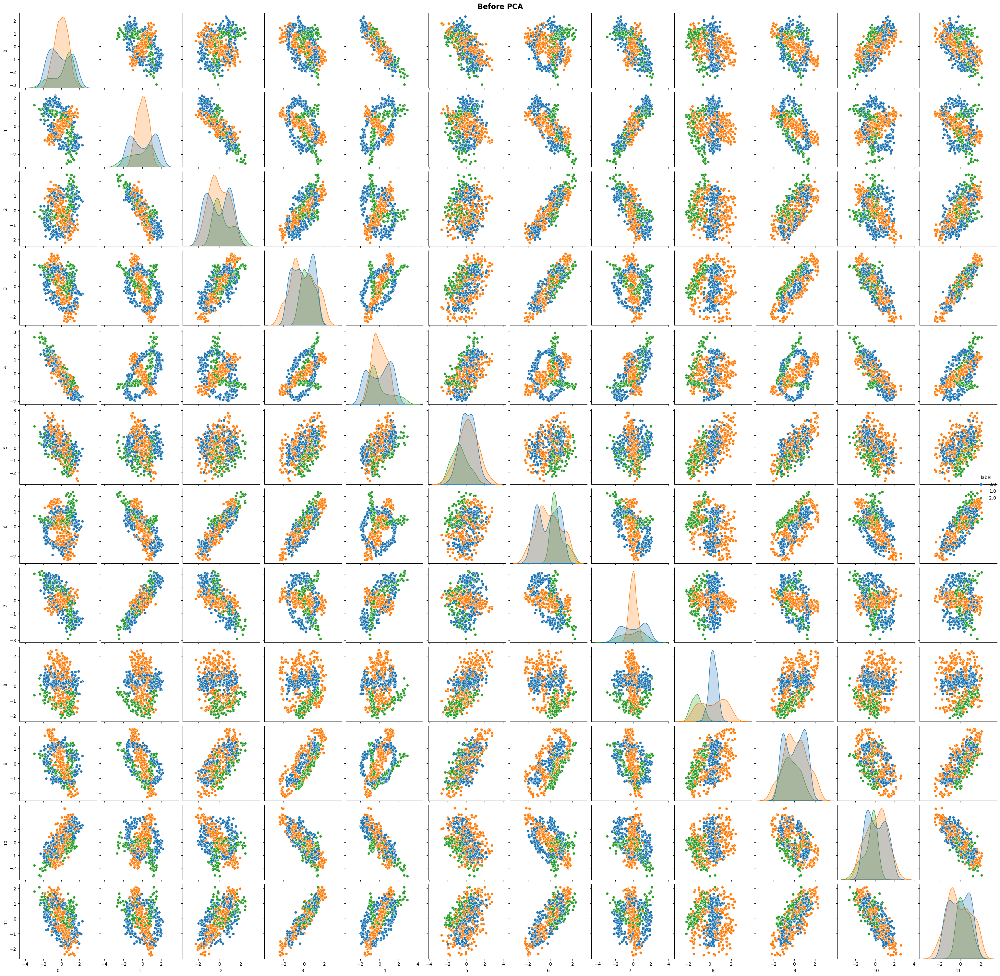

In [8]:
plot_frame = pd.DataFrame(standardized_data)
plot_frame['label'] = label
pplot = sns.pairplot(plot_frame, hue='label', palette=sns.color_palette()[:plot_frame['label'].nunique()])
pplot.fig.set_constrained_layout(True)
pplot.fig.suptitle('Before PCA', weight='bold', fontsize=16)
plt.show()

Variance Ratios: [0.4763583  0.31041612 0.15690151 0.01590454 0.00853639 0.00727203
 0.00698648 0.00500173 0.00459913 0.00352647 0.00251184 0.00198545]


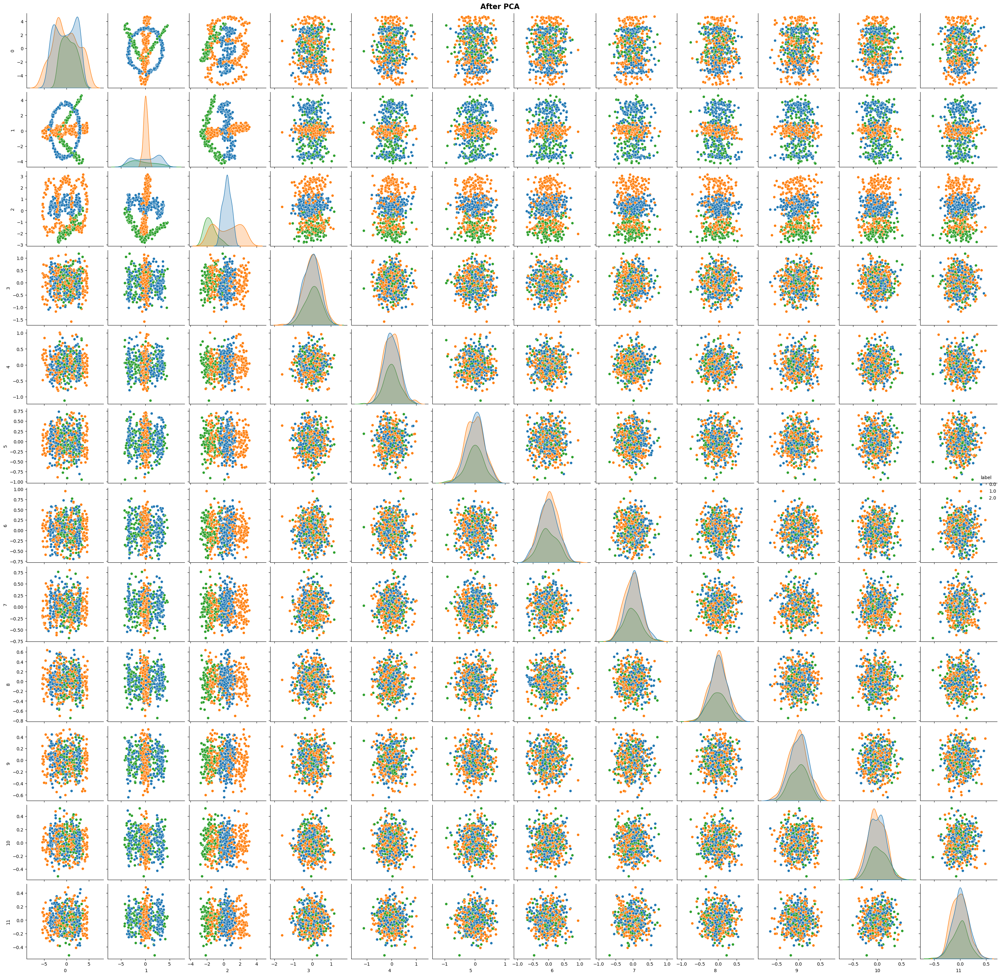

In [9]:
PC = PCA()
PC.fit(standardized_data)
print('Variance Ratios:', PC.explained_variance_ratio_)
reduced = PC.transform(standardized_data)

reduced_df = pd.DataFrame(reduced)
reduced_df['label'] = label
pplot = sns.pairplot(reduced_df, hue='label', palette=sns.color_palette()[:reduced_df['label'].nunique()])
pplot.fig.set_constrained_layout(True)
pplot.fig.suptitle('After PCA', weight='bold', fontsize=16)
plt.show()

### 3. Compare with k-means
We perform a k-means algorithm to cluster the data using $3$ as number of clusters. 
As we expect and see from the output below, this method fails to divide the data as the algorithm classifies the data focusing on the relative distance of the points inside each cluster rather than the data structures. We compare it with the DBscan output using the best found parameters.

K-means score: 0.10992278057849267


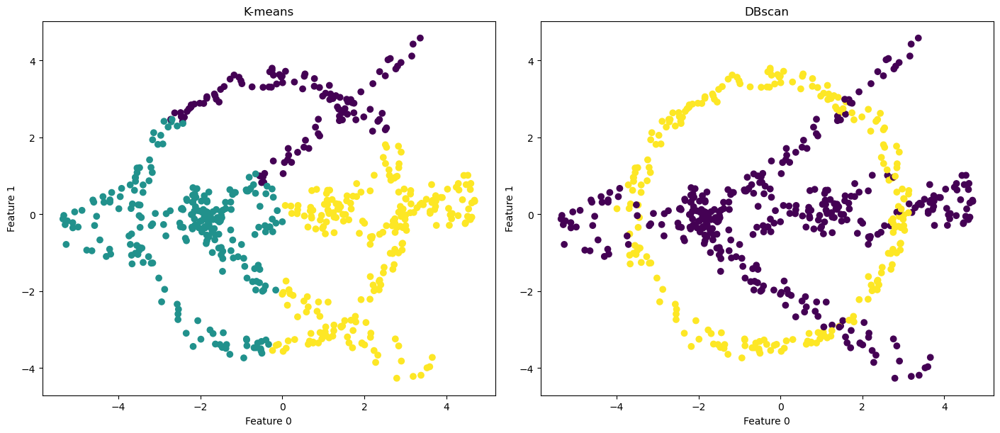

In [18]:
kmeans = KMeans(n_clusters=3)
kpred = kmeans.fit_predict(standardized_data)
print('K-means score:', normalized_mutual_info_score(label, kpred))

db_pred = DBSCAN(eps=best_eps, min_samples=best_pts).fit_predict(x)

fig, ax = plt.subplots(1,2, layout='constrained', figsize=(14,6))
ax[0].scatter(reduced_df[0], reduced_df[1], c=kpred)
ax[0].set_title('K-means')

ax[1].scatter(reduced_df[0], reduced_df[1], c=db_pred)
ax[1].set_title('DBscan')
for ax in ax:
    ax.set_xlabel('Feature 0')
    ax.set_ylabel('Feature 1')
    
plt.show()